<font size="6"><b>Agrupamiento de instituciones de educación superior de EEUU. </b></font>

**Integrantes:**
- Jakelin Daiana Correa Palacio
- Daniela Guardia Cuervo
- Dayra Gabriela Chamorro Revelo
- Fredy Alberto Orozco Loaiza
- Cristian Camilo Henao Rojas

Objetivo: Ayudar a familias latinas en Estados Unidos a elegir una institución de educación superior que se adecúe a sus necesidades.
Población objetivo: Población latina residentes en Estados Unidos interesados en ingresar a una institución de educación superior.


In [1]:
import os
import sklearn
import pandas as pd
import re
import missingno as msno
import  seaborn as sns
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

from sklearn import model_selection
from sklearn import pipeline
from sklearn import preprocessing
from sklearn import impute
from sklearn import compose
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans



KeyboardInterrupt: 

El dataset "College Scorecad" es construído por el departamento de educación de Estados Unidos, el cual contiene 7804 filas y 1726 columnas, las cuales están agrupadas en diferentes categorías: 

- **Root:** acá se tienen variables relacionadas a la información básica de la Universidad.

- **About the School:** más información base de la universidad cómo el nombre, ubicación, etc...

- **Academics:** información relacionada a los programas académicos que oferta la Universidad.

- **Admisions:** datos acerca de los aspirantes a ingresar en la Universidad.

- **Costos:** costos asociados a estudiar a cada Universidad (Estadia, matricula, etc)

- **Student Body:** datos relacionados a los estudiantes de cada Universidad cómo el número de estudiantes no graduados, sus estadísticas demográficas, tipo de matricula y etc.

- **Completion:** información sobre el tiempo de graduación que les toma a las personas graduarse según su tipo de matricula.



In [2]:
df = pd.read_csv('/datasets/collegedataset/CollegeScorecard.csv')
df.head()


/shared-libs/python3.9/py-core/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3135: DtypeWarning: Columns (7,9,1427,1542,1561,1575) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,UNITID,OPEID,opeid6,INSTNM,CITY,STABBR,ZIP,AccredAgency,INSTURL,NPCURL,...,COMPL_RPY_3YR_RT_SUPP,NONCOM_RPY_3YR_RT_SUPP,DEP_RPY_3YR_RT_SUPP,IND_RPY_3YR_RT_SUPP,PELL_RPY_3YR_RT_SUPP,NOPELL_RPY_3YR_RT_SUPP,FEMALE_RPY_3YR_RT_SUPP,MALE_RPY_3YR_RT_SUPP,FIRSTGEN_RPY_3YR_RT_SUPP,NOTFIRSTGEN_RPY_3YR_RT_SUPP
0,100654,100200,1002,Alabama A & M University,Normal,AL,35762,Southern Association of Colleges and Schools C...,www.aamu.edu/,galileo.aamu.edu/netpricecalculator/npcalc.htm,...,0.578873239,0.373790022,0.442857143,0.45890411,0.443586698,0.452513966,0.484818805,0.406,0.423580786,0.44245283
1,100663,105200,1052,University of Alabama at Birmingham,Birmingham,AL,35294-0110,Southern Association of Colleges and Schools C...,www.uab.edu,www.collegeportraits.org/AL/UAB/estimator/agree,...,0.847800926,0.678748759,0.767798013,0.739164697,0.732297853,0.795454545,0.760521886,0.755344418,0.751552795,0.765074771
2,100690,2503400,25034,Amridge University,Montgomery,AL,36117-3553,Southern Association of Colleges and Schools C...,www.amridgeuniversity.edu,tcc.noellevitz.com/(S(miwoihs5stz5cpyifh4nczu0...,...,0.807692308,0.61328125,PrivacySuppressed,0.641114983,0.600877193,0.775,0.610465116,0.686567164,0.632653061,0.65
3,100706,105500,1055,University of Alabama in Huntsville,Huntsville,AL,35899,Southern Association of Colleges and Schools C...,www.uah.edu,finaid.uah.edu/,...,0.892045455,0.689788054,0.800347222,0.75564409,0.738341969,0.851405622,0.768378651,0.79844098,0.778156997,0.791666667
4,100724,100500,1005,Alabama State University,Montgomery,AL,36104-0271,Southern Association of Colleges and Schools C...,www.alasu.edu/email/index.aspx,www.alasu.edu/cost-aid/forms/calculator/index....,...,0.482490272,0.315996848,0.32410212,0.350993377,0.320016821,0.380829016,0.364423718,0.286530612,0.315737052,0.334633385


# Selección de variables

Con miras a cumplir el objetivo de ayudar a las familias a elegir la institución de educación superior, se realiza la selección de algunos criterios que consideramos deben tenerse en cuenta a la hora de tomar la decisión, entre estas se incluyen criterios económicos y sociales.

* <b>instn</b>: nombre de la institución.
* <b>control</b>: estructura de la institución.
* <b>preddeg</b>:  representa el grado predominante otorgado por una universidad (moda del título que entrega).
* <b>menonly</b>: instituciones estadounidenses de educación superior (privadas) de un solo sexo que solo admiten estudiantes hombres.
* <b>womenonly</b>: instituciones estadounidenses de educación superior (privadas) unisex que solo admiten estudiantes mujeres.
* <b> debt_mdn </b>: la suma de todos los préstamos federales originados sobre la educación universitaria de los estudiantes.
* <b> GRAD_DEBT_MDN  </b>:  el promedio de la deuda de los estudiantes graduados.
* <b> RPY_*YR_RT  </b>: fracción de estudiantes que han pagado por lo menos $1 (dólar) de sus préstamos después de salir de la institución.
* <b>ADM_RATE_ALL </b>: tasa de admisión en todos los campus.
* <b> RET_FT4 and RET_PT4 </b>: tasa de retención para estudiantes de tiempo completo y medio tiempo.
* <b> Completion </b>: tasa de estudiantes que completan sus estudios en <b> C200_4 </b> el 200% de tiempo, para carreras de 4 años  <b> C200_L4 </b> el 200% de tiempo, para carreras de menos de 4 años. <b> C150_4_HISP </b> [Hispanic],  <b> C150_4 </b> en el 150% del tiempo, para carreras de 4 años y  <b> C150_L4 </b> en el 150% del tiempo para carreras de menos de 4 años.
* <b> gt_25k_p* </b>: fracción de egresados que ganan más de 25000 dolares.
* <b> NPT4_* </b>: average Net Price PUB --> públicas, PRIV --> privadas.
* <b> faminc </b>: ingreso familiar promedio de los estudiantes.
* <b> md_faminc </b>: mediana de ingreso familiar de los estudiantes.
* <b> faminc_ind </b>: ingreso promedio de los estudiantes independientes.
* <b>hsi</b>: misión especial Hispanic-serving Institutions (estudiantes hispanos o latinos), valor booleano que indica si la institución apoya las minorías latina o no.





In [3]:
reduced_df = df[
                [
                 'INSTNM', 'CONTROL', 'PREDDEG', 'MENONLY', 'WOMENONLY',
                 'DEBT_MDN', 'GRAD_DEBT_MDN', 'RPY_1YR_RT','RPY_3YR_RT',
                 'RPY_5YR_RT', 'RPY_7YR_RT', 'ADM_RATE_ALL', 'RET_FT4', 
                 'RET_PT4', 'C150_4','C150_L4', 'C150_4_HISP', 'C200_4',
                 'C200_L4', 'gt_25k_p6', 'gt_25k_p7', 'gt_25k_p8',
                 'gt_25k_p9', 'gt_25k_p10', 'LATITUDE', 'LONGITUDE',
                 'NPT4_PUB', 'NPT4_PRIV', 'faminc', 'md_faminc', 
                 'faminc_ind', 'HSI', "C150_L4_POOLED"
                 ]
                ]
reduced_df.head()

,INSTNM,CONTROL,PREDDEG,MENONLY,WOMENONLY,DEBT_MDN,GRAD_DEBT_MDN,RPY_1YR_RT,RPY_3YR_RT,RPY_5YR_RT,...,gt_25k_p10,LATITUDE,LONGITUDE,NPT4_PUB,NPT4_PRIV,faminc,md_faminc,faminc_ind,HSI,C150_L4_POOLED
0,Alabama A & M University,1,3,0.0,0.0,19500,33611.5,NaN,0.44471387,0.491894396,...,NaN,34.7834,-86.5685,13415.0,NaN,NaN,NaN,NaN,0.0,NaN
1,University of Alabama at Birmingham,1,3,0.0,0.0,16250,23117,NaN,0.756266667,0.779281931,...,NaN,33.5022,-86.8092,14805.0,NaN,NaN,NaN,NaN,0.0,NaN
2,Amridge University,2,3,0.0,0.0,10500,26995,NaN,0.647249191,0.569395018,...,NaN,32.3626,-86.1740,NaN,7455.0,NaN,NaN,NaN,0.0,NaN
3,University of Alabama in Huntsville,1,3,0.0,0.0,16500,24738,NaN,0.781997919,0.785966981,...,NaN,34.7228,-86.6384,17520.0,NaN,NaN,NaN,NaN,0.0,NaN
4,Alabama State University,1,3,0.0,0.0,15854.5,33452,NaN,0.331198862,0.38562999,...,NaN,32.3643,-86.2957,11936.0,NaN,NaN,NaN,NaN,0.0,NaN


In [4]:
_deepnote_run_altair(reduced_df, """{"data":{"name":"placeholder"},"mark":{"type":"area","tooltip":true},"height":220,"$schema":"https://vega.github.io/schema/vega-lite/v4.json","autosize":{"type":"fit"},"encoding":{"x":{"sort":null,"type":"quantitative","field":"DEBT_MDN","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"COUNT(*)","scale":{"type":"linear","zero":true},"aggregate":"count"},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

# Análisis de valores nulos

In [5]:
import numpy as np
# La llave es el nombre de la variable, y el valor es por el cual se va a cambiar por default
# No la borre o la puse nulo porque en el fondo es información, lo valores lo saqué, sacando el minimo y valor menor.
# Aunque yo creo que dejandolo con -1 es sufuciente.
values = {"GRAD_DEBT_MDN":"NaN", "DEBT_MDN": "NaN", "RPY_3YR_RT":"NaN", "RPY_5YR_RT":"NaN", "RPY_7YR_RT":"NaN"}
for col, val in values.items():
    reduced_df.loc[:,col] = reduced_df.loc[:,col].str.replace(r"PrivacySuppressed",val).astype(float)

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [6]:
null_values = reduced_df.isnull().sum().to_frame()
null_values1 = (reduced_df.shape[0] - null_values[0]).to_frame(name = 'Total valores NO nulos')
null_values1['Porcentaje valores nulos'] =(null_values / reduced_df.shape[0]) * 100
null_values1.style

,Total valores NO nulos,Porcentaje valores nulos
INSTNM,7804,0.000000
CONTROL,7804,0.000000
PREDDEG,7804,0.000000
MENONLY,7383,5.394669
WOMENONLY,7383,5.394669
DEBT_MDN,6641,14.902614
GRAD_DEBT_MDN,6555,16.004613
RPY_1YR_RT,0,100.000000
RPY_3YR_RT,6161,21.053306
RPY_5YR_RT,5910,24.269605


Como se puede observar en la tabla anterior, existen variables con el 100% de los datos nulos. En la gráfica siguiente,  el eje y representa el porcentaje de valores NO nulos en una columna, donde 0 significa que el 100% de los datos son nulos y el 1 significa que esa columna no tiene datos faltantes.

<AxesSubplot:>

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


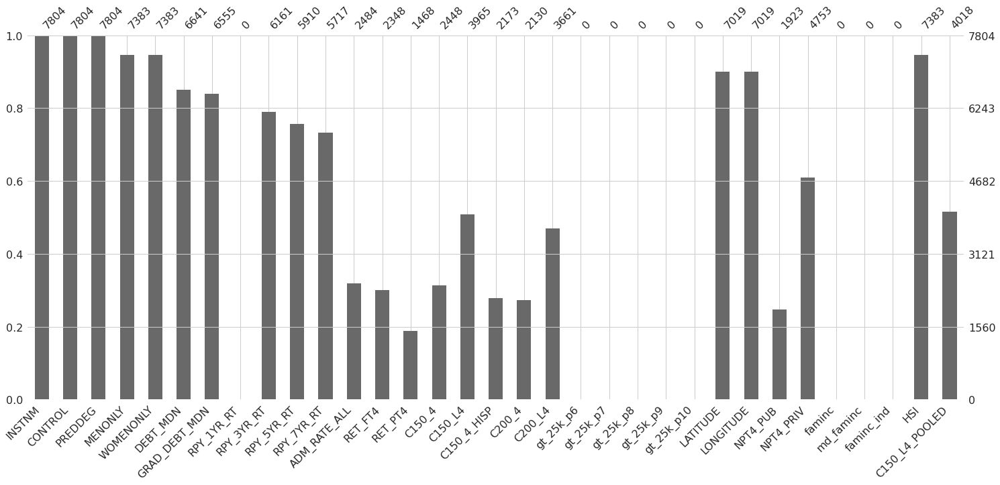

In [7]:
# Analisis de valores nulos, porcetaje de valores nulos en el dataset.}
msno.bar(reduced_df)

Dado que entre las variables seleccionadas se presentan bastantes valores nulos, se procede a realizar una matriz de correlación de valores nulos para analizar dichas correlaciones y así poder tomar una decisión con respecto a estos valores.

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


<AxesSubplot:>

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


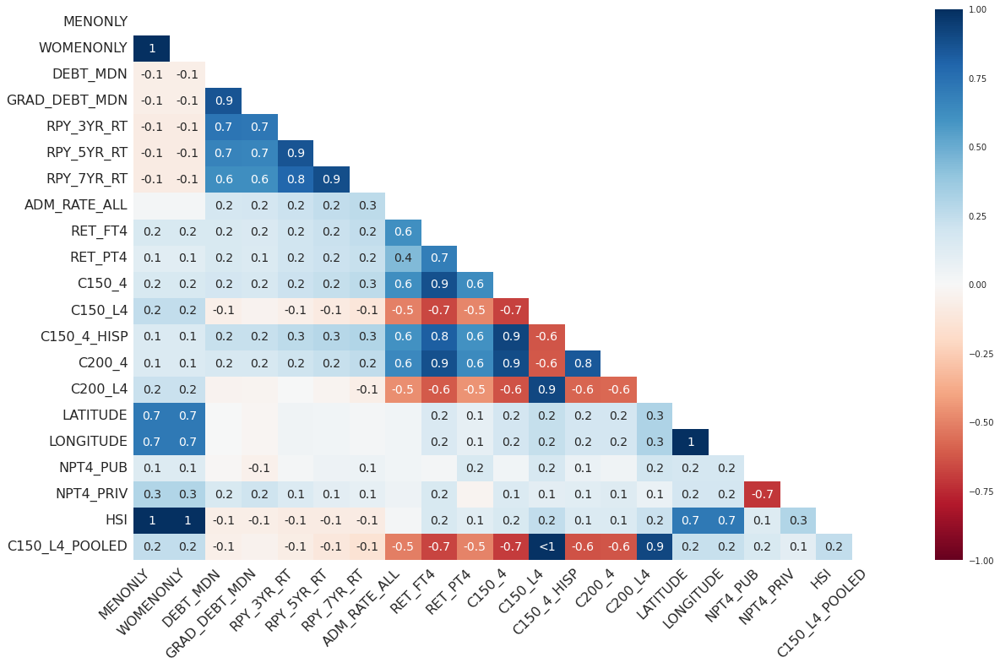

In [8]:
msno.heatmap(reduced_df)

A partir de la alta correlación de algunas variables con valores nulos y de la gran cantidad de variables que presentan muchos datos desconocidos, se decide seguir haciendo el análisis con aquellas variables que tienen menos del 50% de valores nulos, eliminando así 16 de las 33 variables planteadas inicialmente, quedando entonces con 17 variables para continuar, las cuales son:

In [9]:
rate_null = (reduced_df.isnull().sum()/reduced_df.shape[0]) *100
filter_index = rate_null[rate_null<50]
df_filter = reduced_df[filter_index.index].copy()

In [10]:
nuevas_variables = df_filter.isnull().sum() / df_filter.shape[0]
nuevas_variables.to_frame(name='Porcentaje valores nulos').style

,Porcentaje valores nulos
INSTNM,0.000000
CONTROL,0.000000
PREDDEG,0.000000
MENONLY,0.053947
WOMENONLY,0.053947
DEBT_MDN,0.149026
GRAD_DEBT_MDN,0.160046
RPY_3YR_RT,0.210533
RPY_5YR_RT,0.242696
RPY_7YR_RT,0.267427


## Variables numéricas y categoricas.
Para proceder con el análisis, se hizo una distinción de las variables numéricas y categóricas, esto con el fin de realizar un análisis de correlación más adelante entre las variables seleccionadas.

In [11]:
columns = df_filter.columns
variables_categorical = ["CONTROL", "PREDDEG", "MENONLY", "WOMENONLY", "HSI"]
variables_numerical = []
df_filter[variables_categorical] = df_filter[variables_categorical].astype("category")

In [12]:
for col in columns:
    if df_filter[col].dtype == "float64":
        variables_numerical.append(col)

In [13]:
df_filter[variables_categorical].astype("category")

df_filter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7804 entries, 0 to 7803
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   INSTNM          7804 non-null   object  
 1   CONTROL         7804 non-null   category
 2   PREDDEG         7804 non-null   category
 3   MENONLY         7383 non-null   category
 4   WOMENONLY       7383 non-null   category
 5   DEBT_MDN        6641 non-null   float64 
 6   GRAD_DEBT_MDN   6555 non-null   float64 
 7   RPY_3YR_RT      6161 non-null   float64 
 8   RPY_5YR_RT      5910 non-null   float64 
 9   RPY_7YR_RT      5717 non-null   float64 
 10  C150_L4         3965 non-null   float64 
 11  LATITUDE        7019 non-null   float64 
 12  LONGITUDE       7019 non-null   float64 
 13  NPT4_PRIV       4753 non-null   float64 
 14  HSI             7383 non-null   category
 15  C150_L4_POOLED  4018 non-null   float64 
dtypes: category(5), float64(10), object(1)
memory usage: 709.6+ 

# Análisis univariable
Con el fin de comprender las variables finalmente seleccionas, los datos que estas contienen y la información que representan, se prosigue a realizar un análisis univariado para luego analizar en conjunto.

## Control
Esta variable identifica si la estructura de la institución es pública (1), privada sin fines de lucro (2) o privada con fines de lucro (3). A continuación se evidencia el total de instituciones registradas por cada naturaleza (pública, privada sin ánimo de lucro, privada con ánimo de lucro), y el porcentaje de instituciones que representan cada una de estas naturalezas en Estados Unidos. 

In [14]:
tabla = pd.crosstab(index=df_filter['CONTROL'], columns='Total')
tabla['Porcentaje'] = (tabla/tabla.sum()) * 100
tabla.style

col_0,Total,Porcentaje
CONTROL,,
1,2073,26.563301
2,1969,25.230651
3,3762,48.206048


[Text(0, 0, 'Pública'),
 Text(0, 1, 'Privada sin ánimo de lucro'),
 Text(0, 2, 'Privada con ánimo de lucro')]

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


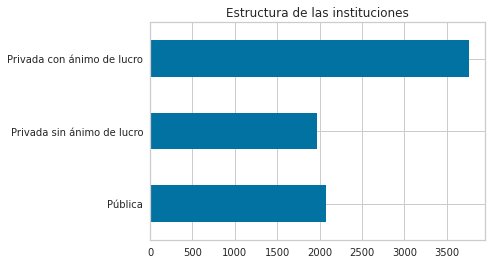

In [15]:
control_count_values = reduced_df['CONTROL'].value_counts().sort_index()
ax = control_count_values.plot(kind='barh', title = 'Estructura de las instituciones')
ax.set_yticklabels(('Pública', 'Privada sin ánimo de lucro', 'Privada con ánimo de lucro'))

Dentro de las instituciones analizadas el 48% son privadas y con ánimo de lucro, el 26% son de carácter público y el 25% restante son privadas sin ánimo de lucro.

## PREDDEG
Predominant Degree o grado dominante hace referencia a cual es el mayor tipo de grado ofrecido por la Universidad.
En este podemos encontrar los siguientes valores:
- 0:
- 1:
- 2:
- 3:
- 4:

<AxesSubplot:>

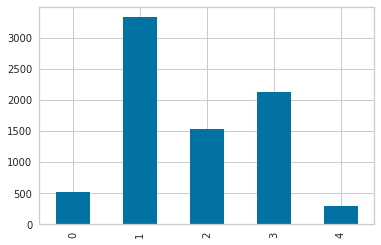

In [16]:
preddeg_count_values = reduced_df['PREDDEG'].value_counts().sort_index()
preddeg_count_values.plot.bar()

## MENONLY

Esta variable puede tomar dos valores: 1, para aquellas instituciones que solo admiten hombres y 0 para aquellas que no es de sólo hombres.

In [17]:
tabla = pd.crosstab(index=df_filter['MENONLY'], columns='Total',)
tabla['Porcentaje'] = round((tabla/tabla.sum()) * 100,2)
tabla.style

col_0,Total,Porcentaje
MENONLY,,
0.0,7316,99.090000
1.0,67,0.910000


(array([0, 1]), [Text(0, 0, 'No solo hombres'), Text(1, 0, 'Solo hombres')])

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


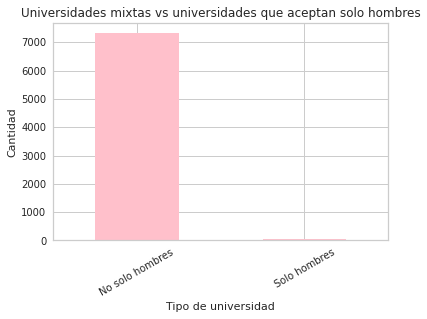

In [18]:
ax = tabla['Total'].plot.bar(xlabel = 'Tipo de universidad', ylabel = 'Cantidad', title = 'Universidades mixtas vs universidades que aceptan solo hombres', color = 'pink',)
ax.set_xticklabels(('No solo hombres', 'Solo hombres'))
plt.xticks(rotation=30)

La cantidad de universidades que no sólo aceptan hombres (puede aceptar sólo mujeres o ser mixtas), supera a las que sólo aceptan hombres en, aproximadamente, un 98%. De las 7804 instituciones registradas, solo 67 es de sólo hombres.

## WOMENONLY

Esta variable puede tomar dos valores: 1, para aquellas instituciones que sólo admiten mujeres y 0 para aquellas que no es de sólo mujeres.

In [19]:
tabla_women = pd.crosstab(index=df_filter['WOMENONLY'], columns='Total',)
tabla_women['Porcentaje'] = round((tabla_women/tabla_women.sum()) * 100,2)
tabla_women.style

col_0,Total,Porcentaje
WOMENONLY,,
0.0,7340,99.420000
1.0,43,0.580000


(array([0, 1]), [Text(0, 0, 'No solo mujeres'), Text(1, 0, 'Solo mujeres')])

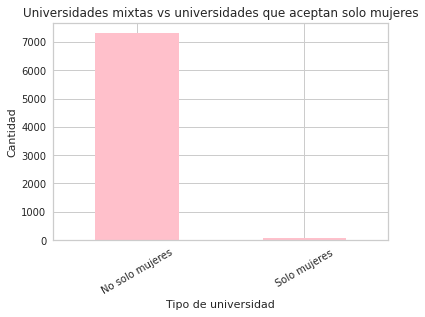

In [20]:
ax = tabla['Total'].plot.bar(xlabel = 'Tipo de universidad', ylabel = 'Cantidad', title = 'Universidades mixtas vs universidades que aceptan solo mujeres', color = 'pink',)
ax.set_xticklabels(('No solo mujeres', 'Solo mujeres'))
plt.xticks(rotation=30)

La cantidad de universidades que no sólo aceptan mujeres (puede aceptar sólo hombres o ser mixtas), supera a las que sólo aceptan mujeres en, aproximadamente, un 99%. De las 7804 instituciones registradas, solo 43 acepta sólo mujeres.

## DEBT_MDN

Esta variable representa la mediana de la deuda de préstamo acumulada en la institución por todos los estudiantes que se gradúan o se retiran.

In [21]:
l = df_filter.DEBT_MDN.describe()
l.to_frame().style

,DEBT_MDN
count,6641.000000
mean,11829.782262
std,5709.625850
min,333.000000
25%,7710.000000
50%,9833.000000
75%,15462.000000
max,131335.000000


<AxesSubplot:title={'center':'Acumulación de deuda de los estudiantes\nGraduados y retirados'}, ylabel='Deuda acumulada (Dólares)'>

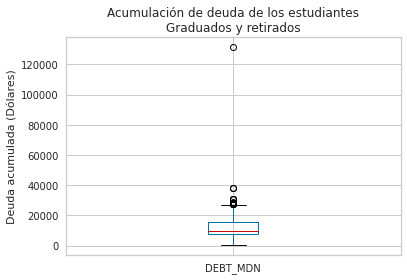

In [22]:
df_filter.DEBT_MDN.plot.box( title = 'Acumulación de deuda de los estudiantes\nGraduados y retirados', ylabel='Deuda acumulada (Dólares)')

En la gráfica se puede observar que las deudas acumuladas de los estudiantes varían, en general, entre $333 y $15462 dólares. Sin embargo se presentan algunos valores atípicos, los cuales se concentran especialmente en aproximadamente $23214 y $40000 dólares, alcanzando el máximo en $131335 dólares. La mediana de las deudas acumuladas por los estudiantes es de $9833 dólares, lo que quiere decir que el 50% de las deudas son inferiores a ese valor.

## GRAD_DEBT_MDN
Esta variable representa también la mediana de la deuda acumulada por los estudiantes con préstamos federales,de únicamente los estudiantes que completaron su carrera.

In [23]:
l = df_filter.GRAD_DEBT_MDN.describe()
l.to_frame().style

,GRAD_DEBT_MDN
count,6555.000000
mean,16906.350648
std,8840.828706
min,723.500000
25%,9500.000000
50%,14144.000000
75%,24546.000000
max,53831.500000


<AxesSubplot:title={'center':'Acumulación de deuda de los estudiantes\ngraduados'}, ylabel='Deuda acumulada (Dólares)'>

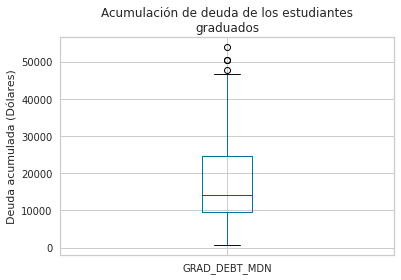

In [24]:
df_filter.GRAD_DEBT_MDN.plot.box( title = 'Acumulación de deuda de los estudiantes\ngraduados', ylabel='Deuda acumulada (Dólares)')

Con respecto a los estudiantes graduados, la mínima deuda acumulada es de $723.5 dólares, y la mayoría de los datos se concentran entre $9500 y $24546 dólares. El 50% de las deudas no superan $14144 dólares, sin embargo, hay algunos valores atípicos que están entre $47115 y $53831. 

## RPY_*YR_RT
Esta variable representa la fracción de estudiantes de cada institución que han adquirido un préstamo federal, no han incumplido con su préstamo y están progresando en su pago, después de haber salido de la institución.
* RPY_3YR_RT --> Datos para <b>tres</b> años después de haber salido de la institución
* RPY_5YR_RT --> Datos para <b> cinco </b> años después de haber salido de la institución
* RPY_7YR_RT --> Datos para <b> siete </b> años después de haber salido de la institución

In [25]:
l = df_filter[['RPY_3YR_RT','RPY_5YR_RT','RPY_7YR_RT']].describe()
l.style

,RPY_3YR_RT,RPY_5YR_RT,RPY_7YR_RT
count,6161.000000,5910.000000,5717.000000
mean,0.592577,0.619500,0.696311
std,0.202121,0.190070,0.161053
min,0.000000,0.090323,0.184783
25%,0.436446,0.470262,0.581588
50%,0.579019,0.606989,0.700446
75%,0.763398,0.775916,0.830882
max,1.000000,1.000000,1.000000


Text(0.5, 1.12, 'Fracción de estudiantes que avanzan en el pago de sus préstamos\n(Después de 3,5 y 7 años de salir de la universidad)')

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


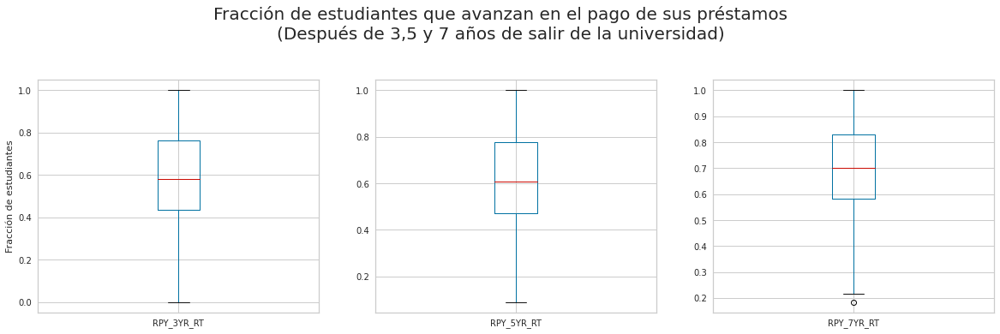

In [26]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
df_filter.RPY_3YR_RT.plot.box(ax=axes[0], ylabel='Fracción de estudiantes')
df_filter.RPY_5YR_RT.plot.box(ax=axes[1])
df_filter.RPY_7YR_RT.plot.box(ax=axes[2])
fig.suptitle('Fracción de estudiantes que avanzan en el pago de sus préstamos\n(Después de 3,5 y 7 años de salir de la universidad)', y=1.12, size=20)

Al comparar los datos de estas variables, se puede observar que a medida que van pasando los años, los estudiantes que avanzan con sus pagos van aumentando de a poco, por ejemplo, en el año 3 en el 50% de las universidades, al menos del 57% de sus ex-estudiantes empezaron a pagar; en el año 5 ese porcentaje subió al 60%, y para el año 7 subió hasta el 70%. Es decir, para el año 7, en el 50% de las universidades, al menos el 70% de los estudiantes avanzan con el pago de sus deudas.

Entre los 3 y 5 años de haber dejado la universidad, no hay mucha variabilidad, lo que indica que en ese periodo, pocos estudiantes empiezan a pagar sus deudas. Entre 5 y 7 años se nota un cambio un poco más significativo.

## C150_L4 Y C150_L4_POOLED
Esta variable representa la tasa de finalización por cada universidad en carreras de menos de 4 años, esta medida indica quiénes terminan su carrera dentro del 150% del tiempo en el que esperaban graduarse. Para reducir la variabilidad de un año a otro, los datos también están disponibles como tasas de finalización agrupadas a lo largo de dos años de forma continua (<b>C_150_L4_POOLED</b>)

In [27]:
l = df_filter[['C150_L4', 'C150_L4_POOLED']].describe()
l.style

,C150_L4,C150_L4_POOLED
count,3965.000000,4018.000000
mean,0.558966,0.562329
std,0.259476,0.250625
min,0.000000,0.000000
25%,0.330100,0.353096
50%,0.610800,0.616015
75%,0.762700,0.759985
max,1.000000,1.000000


Text(0.5, 1.05, 'Tasa de finalización\n(Dentro del 150% del tiempo esperado)')

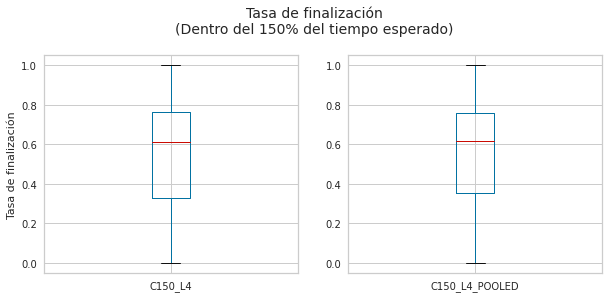

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,4))
df_filter.C150_L4.plot.box(ax=axes[0], ylabel='Tasa de finalización')
df_filter.C150_L4_POOLED.plot.box(ax=axes[1])
fig.suptitle('Tasa de finalización\n(Dentro del 150% del tiempo esperado)', y=1.05, size=14)

La tasa de estudiantes que se gradúan dentro del 150% del tiempo esperado, se concentra entre 0.33 y 0.76 aproximadamente. En el 50% de las universidades reportadas, la tasa de graduación supera el 0.6, llegando a universidades en las que el 100% de estudiantes se gradúan dentro de este tiempo. En esta ocasión, no encontramos datos atípicos para ninguna de las dos variables y su distribución es muy similar.

## LATITUDE y LONGITUDE

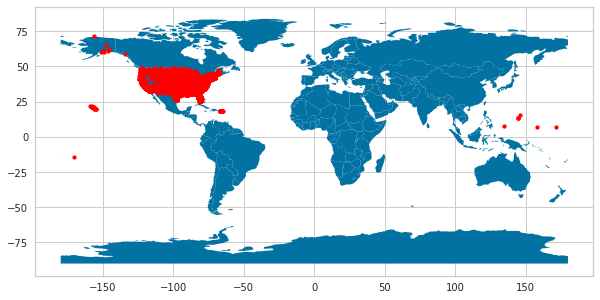

In [29]:

geometry = [Point(xy) for xy in zip(df_filter['LONGITUDE'], df['LATITUDE'])]
gdf = GeoDataFrame(df_filter, geometry=geometry)   

#this is a simple map that goes with geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

En el mapa se puede observar la ubicación de las instituciones que participan en el estudio, la mayoría de ellas se encuentran en Estados Unidos, pero se pueden encontrar también algunas que están ubicadas en lugares cercanos, como Alaska. También se pueden observar  unos valores atípicos, los cuales ubican universidades en el océano pacífico.

## NPT4_PRIV
Esta variable indica el precio neto promedio, derivado del costo total de asistencia (incluida la matrícula y cuotas, libros y suministros, y gastos de manutención) menos los impuestos federales, estatales y ayuda institucional, para estudiantes de pregrado que reciben Título IV; lo que da una idea de cuánto puede vostar estudiar en universidades privadas.

In [30]:
l = df_filter.NPT4_PRIV.describe()
l.to_frame().style

,NPT4_PRIV
count,4753.000000
mean,18071.811908
std,7250.903684
min,-1220.000000
25%,13132.000000
50%,18259.000000
75%,22485.000000
max,87570.000000


<AxesSubplot:title={'center':'Precio neto promedio'}, ylabel='Dinero (Dólares)'>

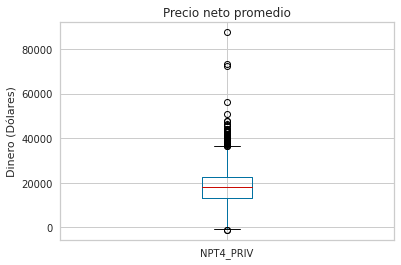

In [31]:
df_filter.NPT4_PRIV.plot.box( title = 'Precio neto promedio', ylabel='Dinero (Dólares)')

El precio promedio de estudiar en una universidad privada, generalmente está entre $13132 y $22485 dólares. Los datos recolectados en esta variable, presentan muchos datos atípicos, de los cuales el costo asciende desde casi $40000 dólares hasta superar lo $80000 dólares.

## HSI
Representa las instituciones que se identifican como instituciones al servicio de las minorías, en este caso, de los hispanos. Aquí un valor de 0, indica que no se identifica como institución al servicio de los hispanos, y un 1 si sí lo hace.

In [32]:
tabla_hsi = pd.crosstab(index=df_filter['HSI'], columns='Total',)
tabla_hsi['Porcentaje'] = round((tabla_hsi/tabla_hsi.sum()) * 100,2)
tabla_hsi.style

col_0,Total,Porcentaje
HSI,,
0.0,7251,98.210000
1.0,132,1.790000


(array([0, 1]), [Text(0, 0, 'No'), Text(1, 0, 'Si')])

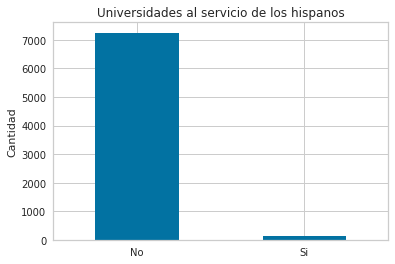

In [33]:
ax = tabla_hsi['Total'].plot.bar(xlabel='', ylabel = 'Cantidad', title = 'Universidades al servicio de los hispanos')
ax.set_xticklabels(('No', 'Si'))
plt.xticks(rotation=0)

Solo el 1.79%, es decir, 132 de las 7383  instituciones que registran en esta variable, se identifican como instituciones al servicio de los hispanos.

# Análisis multivariable


## Matriz de correlación

<AxesSubplot:>

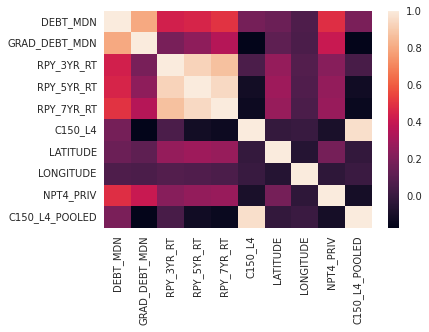

In [34]:
sns.heatmap(df_filter[variables_numerical].corr())

Las variables con correlación más alta son
* <b>RPY_3TR_RT</b>, <b>RPY_5TR_RT </b> y <b> RPY_7TR_RT</b>
* <b>C150_L4</b> y <b>CL150_l4_POOLED</b>
* <b>GRAD_DEBT_MDN</b> y <b>DEBT_MDN</b>

Se realiza una gráfica de pares para mirar como están relacionadas las variables numéricas entre si. Nuevamente se nota una alta correlación entre las variables mencionadas anteriormente.

In [35]:
input_1 = 'Option 1'

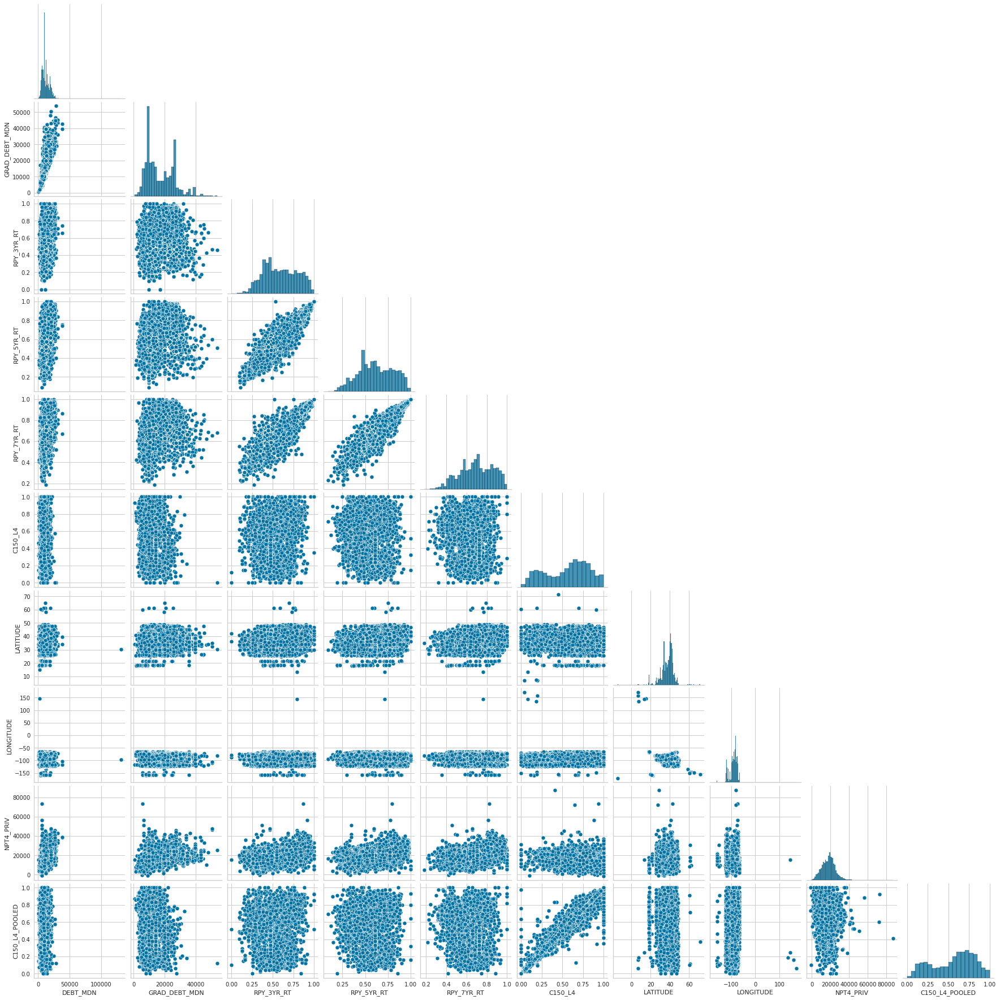

In [36]:
sns.pairplot(df_filter[variables_numerical], corner=True)

## GRAD_DEBT_MDN vs DEBT_MDN

In [37]:
describe = df_filter[['DEBT_MDN','GRAD_DEBT_MDN','CONTROL']].groupby('CONTROL').median()
describe.style.set_caption('Mediana de la deuda acumulada por tipo de institución')



,DEBT_MDN,GRAD_DEBT_MDN
CONTROL,,
1,8428.000000,12702.000000
2,17789.000000,25000.000000
3,9500.000000,11541.750000


En general, los estudiantes de las universidades de tipo privada sin fines de lucro (2) adquieren una deuda significativamente mayor. Para las instituciones públicas (1), el 50% de los graduados acumularon una deuda de $12702 dólares o menos, mientras que para las instituciones  privadas con ánimo de lucro (3) este valor es de $11541.75 dólares. La diferencia entre estos dos últimos tipos de universidad no es tan grande.

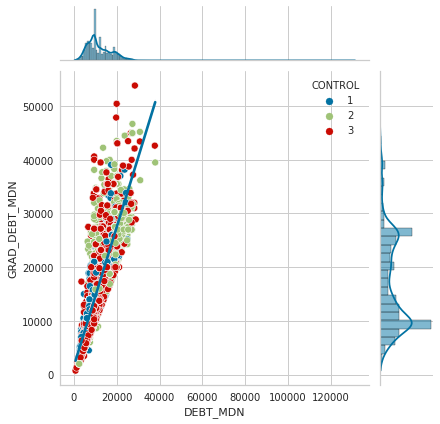

In [38]:
g = sns.jointplot(x = 'DEBT_MDN', y = 'GRAD_DEBT_MDN', data = df_filter, kind='reg', scatter = False)

sns.scatterplot(x = 'DEBT_MDN', y = 'GRAD_DEBT_MDN', data = df_filter, hue="CONTROL", ax=g.ax_joint)

plt.show()

## Outliers

A partir del analisis univariado notamos los datos atípicos de las variables DEBT_MDN,  GRAD_DEBT_MDN, NPT4_PRIV y RPY_7YR_RT. Se decide eliminar los datos atípicos que no estuvieran dentro del rango de percentil 1 y 99.

In [39]:
# Outliers
# Variables con outliers: DEBT_MDN | GRAD_DEBT_MDN | NPT4_PRIV| RPY_7YR_RT
df_filter_aux = df_filter.copy()

#DEBT_MDN
df_filter_aux = df_filter_aux[~(df_filter.DEBT_MDN.quantile(.01) > df_filter_aux.DEBT_MDN) &
                       ~(df_filter_aux.DEBT_MDN > df_filter.DEBT_MDN.quantile(.99))]

#GRAD_DEBT_MDN
df_filter_aux = df_filter_aux[~(df_filter.GRAD_DEBT_MDN.quantile(.01) > df_filter_aux.GRAD_DEBT_MDN) &
                       ~(df_filter_aux.GRAD_DEBT_MDN > df_filter.GRAD_DEBT_MDN.quantile(.99))]

#NPT4_PRIV
df_filter_aux = df_filter_aux[~(df_filter.NPT4_PRIV.quantile(.01) > df_filter_aux.NPT4_PRIV) &
                       ~(df_filter_aux.NPT4_PRIV > df_filter.NPT4_PRIV.quantile(.99))]

#RPY_7YR_RT
df_filter_aux = df_filter_aux[~(df_filter.RPY_7YR_RT.quantile(.01) > df_filter_aux.RPY_7YR_RT) &
                       ~(df_filter_aux.RPY_7YR_RT > df_filter.RPY_7YR_RT.quantile(.99))]


df_filter = df_filter_aux.copy()
df_filter.shape

(7393, 17)

## Preprocesamiento de valores

Las filas que presentan valores nulos, presenta información para el modelo. Para algunas variables no se encontraron datos, ya sea porque la universidad tiene el dato como restringido o no se ha terminado el año escolar, por lo tanto, por cada columna se crea una nueva variable que lleva un boolean  (1.0 o 0.0), esto con el fin darle más información al modelo y que pueda encontrar patrones en los valores nulos.

In [40]:
def addes_null_value_column(df_filter):
    """Esta tecnica agrega más información a nuestro modelo
        Más información: https://www.kaggle.com/code/dansbecker/handling-missing-values/notebook
        Extract_column method
    """
    cols_with_missing = [col for col in df_filter.columns 
                                    if df_filter[col].isnull().any()]
    new_categorical = []
    for col in cols_with_missing:
        name = col + '_was_missing'
        df_filter[name] = df_filter[col].isnull().astype(float)
        new_categorical.append(name)
    return df_filter.copy(), new_categorical

Para proceder con el análisis, se realizó la siguiente modificación a las variables finales:

* Los valores faltantes en las columnas con variables de tipo categórica se reemplazan por la moda de los datos la columna, y se decodifican usando el método One Hot Encoding
* Los valores faltantes en las columnas con variables de tipo numérica, luego se normalizan los datos por $$X \sim \mathcal{N}(0,\,1)$$ 
* Cuando se aplican las transformaciones tanto a las variables numericas y categoricas. Se hace un PCA donde sé desea tener el 86 % de la varianza


In [41]:
# Preprosecing the values with sklearn
extract_tecnic = True


imputer_numerical = impute.SimpleImputer(strategy="mean")
numerical_preprocessor = pipeline.Pipeline(steps=[
    ("imputer", imputer_numerical ),
    ("scaler", preprocessing.StandardScaler())
])

imputer_categorical =  impute.SimpleImputer(strategy="most_frequent")
categorical_preprocessor = pipeline.Pipeline(steps=[
    ("imputer", imputer_categorical),
    ("onehot", preprocessing.OneHotEncoder(handle_unknown="ignore"))
])

normal_values_preprocessor = pipeline.Pipeline(steps=[
     ("imputer", impute.SimpleImputer(strategy="most_frequent"))
])

if extract_tecnic:

    df_filter,new_categorical = addes_null_value_column(df_filter)
    preprocessor = compose.ColumnTransformer(
        transformers=[
            ("numerical_preprocessor", numerical_preprocessor, variables_numerical),
            ("categorical_preprocessor", categorical_preprocessor, variables_categorical),
            ("missing_columns", normal_values_preprocessor, new_categorical)
        ]
    )

else:
    preprocessor = compose.ColumnTransformer(
        transformers=[
            ("numerical_preprocessor", numerical_preprocessor, variables_numerical),
            ("categorical_preprocessor", categorical_preprocessor, variables_categorical),
        ]
    )



# Model pipeline
pca = PCA(n_components=0.86)
kmeans = KMeans(random_state=999)
visualizer = KElbowVisualizer(kmeans, k=(1,12))

pca_pipeline = pipeline.Pipeline(steps=[
    ("preprocessing", preprocessor),
    ("PCA",pca )
])

data_transform = pca_pipeline.fit_transform(df_filter)

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode = stats.mode(array)
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid

# Agrupamiento

Inicialmente, se requiere identificar qué hace el PCA, para lo cual se quiere que estos componentes sólo tengan 86% de la varianza.

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


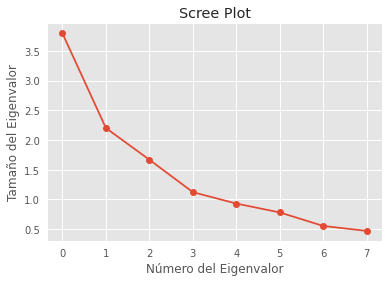

In [42]:
ev = pca.explained_variance_
plt.style.use("ggplot") 
plt.plot(ev, marker='o')
plt.xlabel("Número del Eigenvalor")
plt.ylabel("Tamaño del Eigenvalor")
plt.title("Scree Plot")
plt.show()

Al aplicar el PCA, se escogieron 8 componentes, las cuales van a ingresar al modelo de kmeans. 

## Curva de codo
Con el fin de encontrar el número ideal de clústers para clasificar los datos, se realiza una curva de codo, con la cual se obtiene que el número ideal de clústers para este caso son 4 (k).
En otro eje se tiene el tiempo que toma entrenar el modelo.

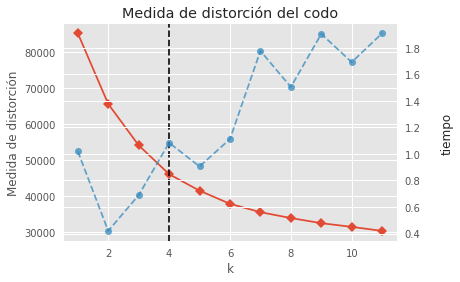

In [43]:
#Diagrama del coodo
import matplotlib.pyplot as plt
visualizer = KElbowVisualizer(kmeans, k=(1,12)).fit(data_transform)

visualizer.ax.set_xlabel("k")
visualizer.ax.set_ylabel("Medida de distorción")
plt.title("Medida de distorción del codo")
plt.gcf().text(1, 0.5, "tiempo", fontsize=12, va='center', rotation="90")
plt.show()

Se crea el kmeans con el k óptimo. Este modelo se le agrega al pipeline del PCA.

In [44]:
best_model = KMeans(n_clusters = 4, random_state=999)
kmeans_pipeline = pipeline.Pipeline(steps=[
    ("data_transform", pca_pipeline),
    ("kmeans", best_model)
])

kmeans_pipeline

Pipeline(steps=[('data_transform',
                 Pipeline(steps=[('preprocessing',
                                  ColumnTransformer(transformers=[('numerical_preprocessor',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer()),
                                                                                   ('scaler',
                                                                                    StandardScaler())]),
                                                                   ['DEBT_MDN',
                                                                    'GRAD_DEBT_MDN',
                                                                    'RPY_3YR_RT',
                                                                    'RPY_5YR_RT',
                                                                    'RPY_7YR_RT',
                                                                    'C150_L4',
                                                                    'LATITUDE',
                                                                    'LONGITUDE',
                                                                    'NPT4_PRIV',
                                                                    'C150_L4_POOLED']),
                                                                  ('categorical_prepro...
                                                                    'DEBT_MDN_was_missing',
                                                                    'GRAD_DEBT_MDN_was_missing',
                                                                    'RPY_3YR_RT_was_missing',
                                                                    'RPY_5YR_RT_was_missing',
                                                                    'RPY_7YR_RT_was_missing',
                                                                    'C150_L4_was_missing',
                                                                    'LATITUDE_was_missing',
                                                                    'LONGITUDE_was_missing',
                                                                    'NPT4_PRIV_was_missing',
                                                                    'HSI_was_missing',
                                                                    'C150_L4_POOLED_was_missing'])])),
                                 ('PCA', PCA(n_components=0.86))])),
                ('kmeans', KMeans(n_clusters=4, random_state=999))])

En el Pipeline, se puede ver toda las transformaciones que se le hacen a nuestro datos, en el Pipeline de <b>missing_columns</b> son las columnas que tienen las variables que dicen que filas tiene el valor nulo.

Hacemos el entrenamiento de kmeans.

In [45]:
_ =  kmeans_pipeline.fit_transform(df_filter)

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode = stats.mode(array)
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid

## Inferencia del modelo

In [46]:
# Dado que se usaron los pipeline para la trasformación de los datos, estos no se hacen directamente sobre el dataframe
# lo rellenamos para hacer la inferencia del modelo

df_filter[variables_numerical] = imputer_numerical.fit_transform(df_filter[variables_numerical])
df_filter[variables_categorical] = imputer_categorical.fit_transform(df_filter[variables_categorical])

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode = stats.mode(array)


In [47]:
df_filter["Cluster"] = best_model.labels_
val =  variables_numerical + ["Cluster"]

En esta sección se realiza la inferencia del modelo para identificar características y tendencias en cada clúster.

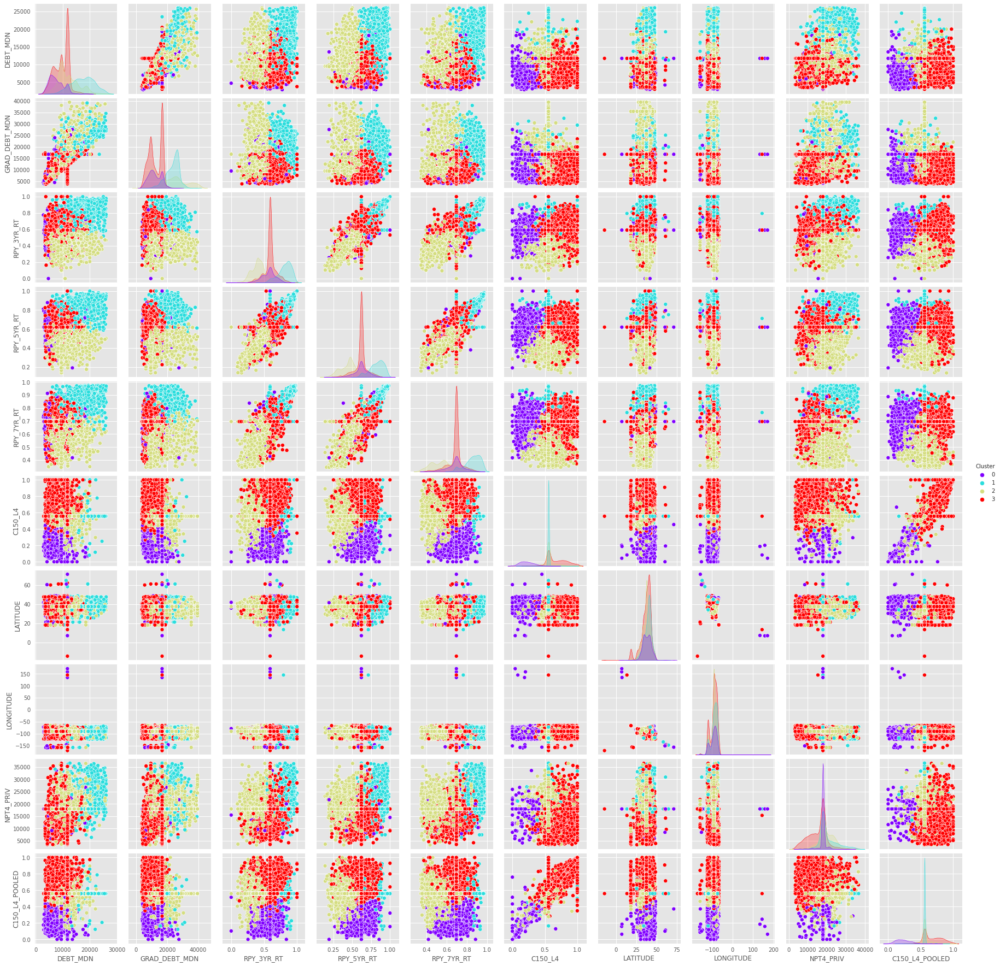

In [48]:
sns.pairplot(df_filter[val], hue="Cluster",palette="rainbow")

In [49]:
val_nulos = list(map(lambda x: x.replace("_was_missing", ""), new_categorical))

def filters_corr(df_filter, cluster):
    global variables_numerical
    group  = df_filter[df_filter["Cluster"] == cluster]
    print(group[variables_numerical].describe())
    sns.heatmap(group[variables_numerical].corr())

def filters_descriptive(df_filter, cluster):
    global variables_numerical
    group  = df_filter[df_filter["Cluster"] == cluster]
    print(group[variables_numerical].describe())

def filters_pairs(df_filter, cluster):
    global variables_numerical
    group  = df_filter[df_filter["Cluster"] == cluster]
    sns.pairplot(group[variables_numerical])

def plotes_mundial(df_filter, cluster):

    group  = df_filter[df_filter["Cluster"] == cluster]
    geometry = [Point(xy) for xy in zip(group['LONGITUDE'], group['LATITUDE'])]
    gdf = GeoDataFrame(group, geometry=geometry)   
    #this is a simple map that goes with geopandas
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

# Análisis de Clústers

## Clúster 0

Descripción clúster 0

### Variables numéricas

El cluster 0, tiende a tener mayor correlación con las variables:

* BEBT_MDN y GRAD_DEBT_MDN
*  RPY_3TR_RT, RPY_5TR_RT y RPY_7TR_RT
* C150_L4 y C_L4_POOLED

           DEBT_MDN  GRAD_DEBT_MDN   RPY_3YR_RT   RPY_5YR_RT   RPY_7YR_RT  \
count   1065.000000    1065.000000  1065.000000  1065.000000  1065.000000   
mean    7621.069240   12076.964196     0.567997     0.619276     0.684621   
std     2656.729948    4111.036020     0.108992     0.094783     0.078595   
min     2869.500000    3968.000000     0.000000     0.191617     0.392157   
25%     5500.000000    9000.000000     0.492013     0.578208     0.647541   
50%     7053.000000   11500.000000     0.591464     0.620270     0.696111   
75%     9500.000000   16559.000000     0.629175     0.672794     0.724734   
max    19317.000000   27588.000000     0.886598     1.000000     0.921875   

           C150_L4     LATITUDE    LONGITUDE     NPT4_PRIV  C150_L4_POOLED  
count  1065.000000  1065.000000  1065.000000   1065.000000     1065.000000  
mean      0.217666    37.947494   -92.318129  17734.114158        0.224985  
std       0.101063     5.396092    22.120474   1998.242179        0.103940 

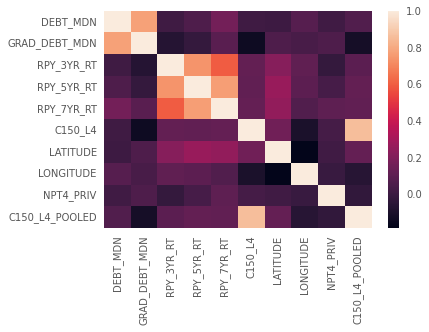

In [50]:
filters_corr(df_filter, 0)

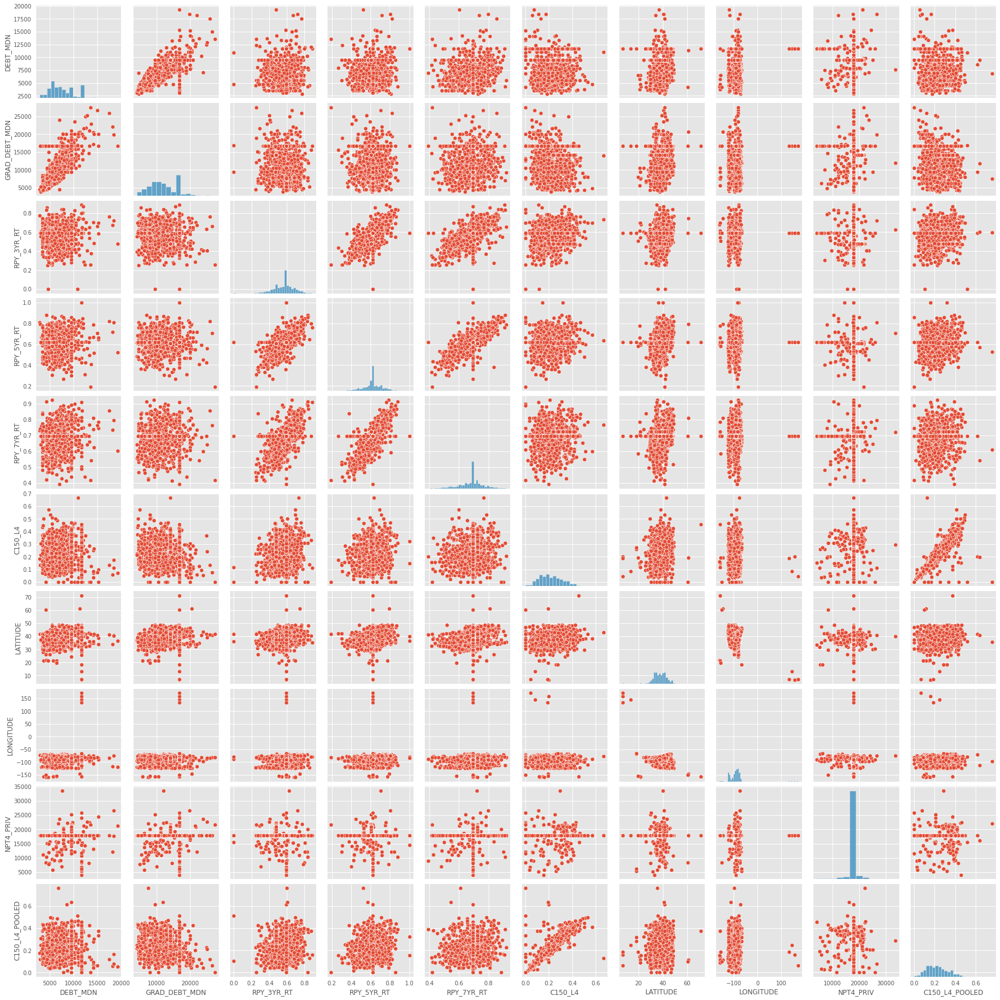

In [51]:
filters_pairs(df_filter, 0)

En general el clúster tiene muchas localidades de los estados unidos. Viendo que excluye unas zonas centrales.

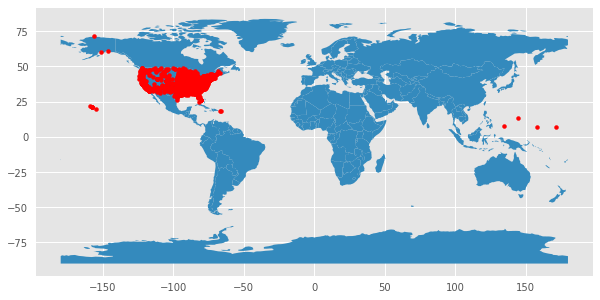

In [52]:
plotes_mundial(df_filter, 0)

### Variables categóricas

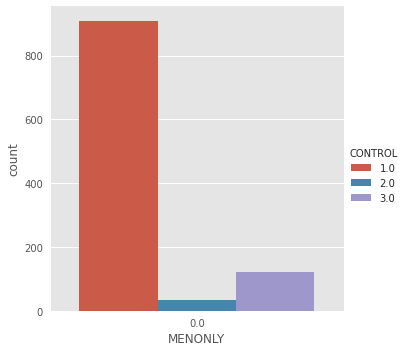

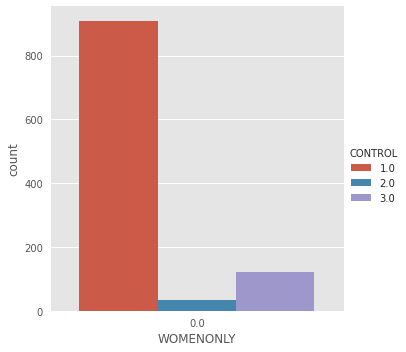

In [53]:

g = sns.catplot(data=df_filter[df_filter["Cluster"] == 0], x="MENONLY", kind='count', hue="CONTROL")
g = sns.catplot(data=df_filter[df_filter["Cluster"] == 0], x="WOMENONLY", kind='count', hue="CONTROL")


Todos las instituciones que pertenecen al grupo 0, aceptan tanto a hombres como a mujeres, y en su mayoría pertenecen al sector público.

## Clúster 1


### Variables numéricas

El cluster 1, tiende a tener mayor correlación con las variables:

* BEBT_MDN y GRAD_DEBT_MDN
* RPY_3TR_RT, RPY_5TR_RT y RPY_7TR_RT
* C150_L4 y C_L4_POOLED



           DEBT_MDN  GRAD_DEBT_MDN   RPY_3YR_RT   RPY_5YR_RT   RPY_7YR_RT  \
count   1722.000000    1722.000000  1722.000000  1722.000000  1722.000000   
mean   17406.585136   23387.168366     0.813457     0.823944     0.860051   
std     4079.972394    4364.164195     0.099762     0.091032     0.073306   
min     5850.000000    5850.000000     0.440756     0.543326     0.633065   
25%    14500.000000   20624.250000     0.756245     0.766228     0.817102   
50%    17525.250000   24500.000000     0.831169     0.838451     0.870602   
75%    20500.000000   27000.000000     0.887705     0.895389     0.918023   
max    26035.000000   39162.500000     1.000000     1.000000     0.973322   

           C150_L4     LATITUDE    LONGITUDE     NPT4_PRIV  C150_L4_POOLED  
count  1722.000000  1722.000000  1722.000000   1722.000000     1722.000000  
mean      0.557042    39.027700   -88.704767  20415.647567        0.559892  
std       0.038396     4.725276    15.739230   4773.630842        0.036309 

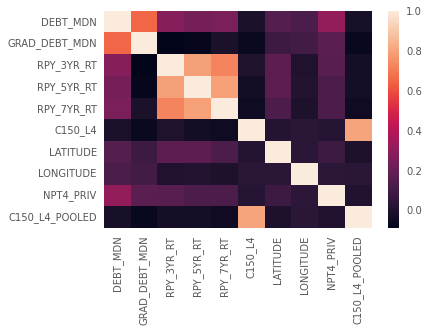

In [54]:
filters_corr(df_filter, 1)

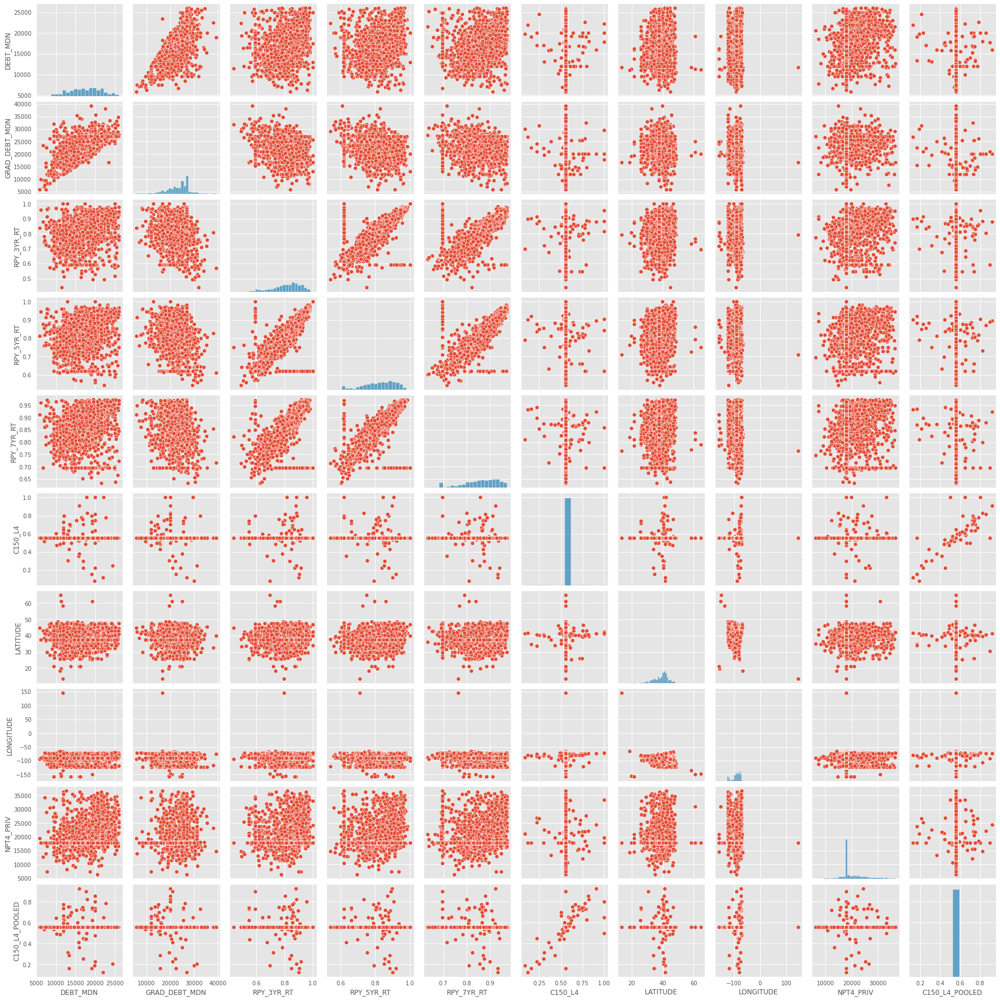

In [55]:
filters_pairs(df_filter, 1)

Este clúster no tiene muchas universidades de ultramar, y la en la zona central de los estados unidos.

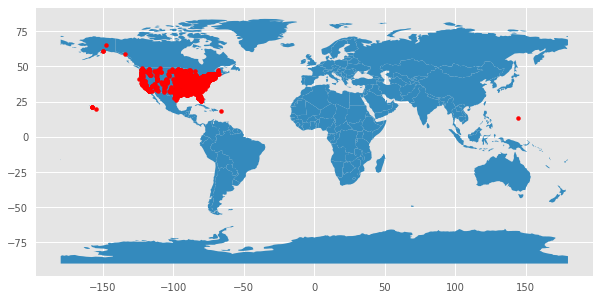

In [56]:
plotes_mundial(df_filter, 1)

### Variables categóricas

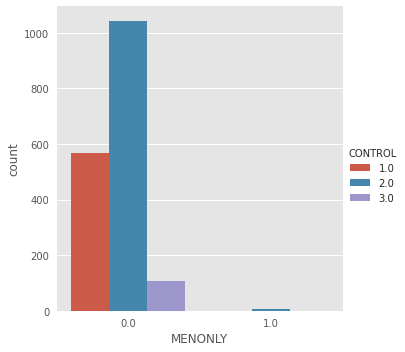

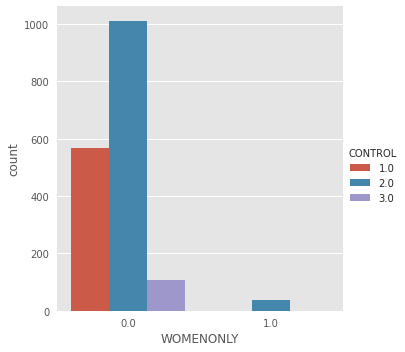

In [57]:
sns.catplot(data=df_filter[df_filter["Cluster"] == 1], x="MENONLY", kind='count', hue="CONTROL")
sns.catplot(data=df_filter[df_filter["Cluster"] == 1], x="WOMENONLY", kind='count', hue="CONTROL")

En el caso del clúster 1, se puede observar que si existen algunas instituciones (aunque muy pocas) que aceptan solo hombres o solo mujeres. También cabe resaltar que en este caso, la mayoría de universidades son de carácter privado sin ánimo de lucro (3), seguidas por las que son de carácter público y en menor cantidad las que pertenecen al sector privado con fines de lucro.

## Clúster 2



### Variables numéricas

           DEBT_MDN  GRAD_DEBT_MDN   RPY_3YR_RT   RPY_5YR_RT   RPY_7YR_RT  \
count   1849.000000    1849.000000  1849.000000  1849.000000  1849.000000   
mean   11980.334970   19846.922246     0.397651     0.444050     0.566806   
std     3774.394328    9731.918726     0.098029     0.105788     0.109928   
min     3848.500000    3888.000000     0.000000     0.138514     0.344304   
25%     9500.000000   10000.000000     0.334683     0.369681     0.467085   
50%    11116.500000   19000.000000     0.404959     0.466683     0.575651   
75%    14656.500000   26000.000000     0.468017     0.519659     0.667194   
max    25999.500000   39499.500000     0.739011     0.731707     0.842775   

           C150_L4     LATITUDE    LONGITUDE     NPT4_PRIV  C150_L4_POOLED  
count  1849.000000  1849.000000  1849.000000   1849.000000     1849.000000  
mean      0.564098    36.626624   -91.228508  19738.524975        0.567461  
std       0.100656     4.641667    13.233938   4313.910216        0.091895 

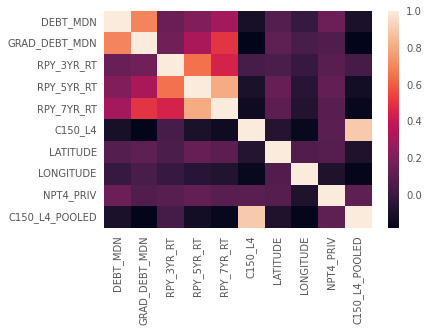

In [58]:
filters_corr(df_filter, 2)

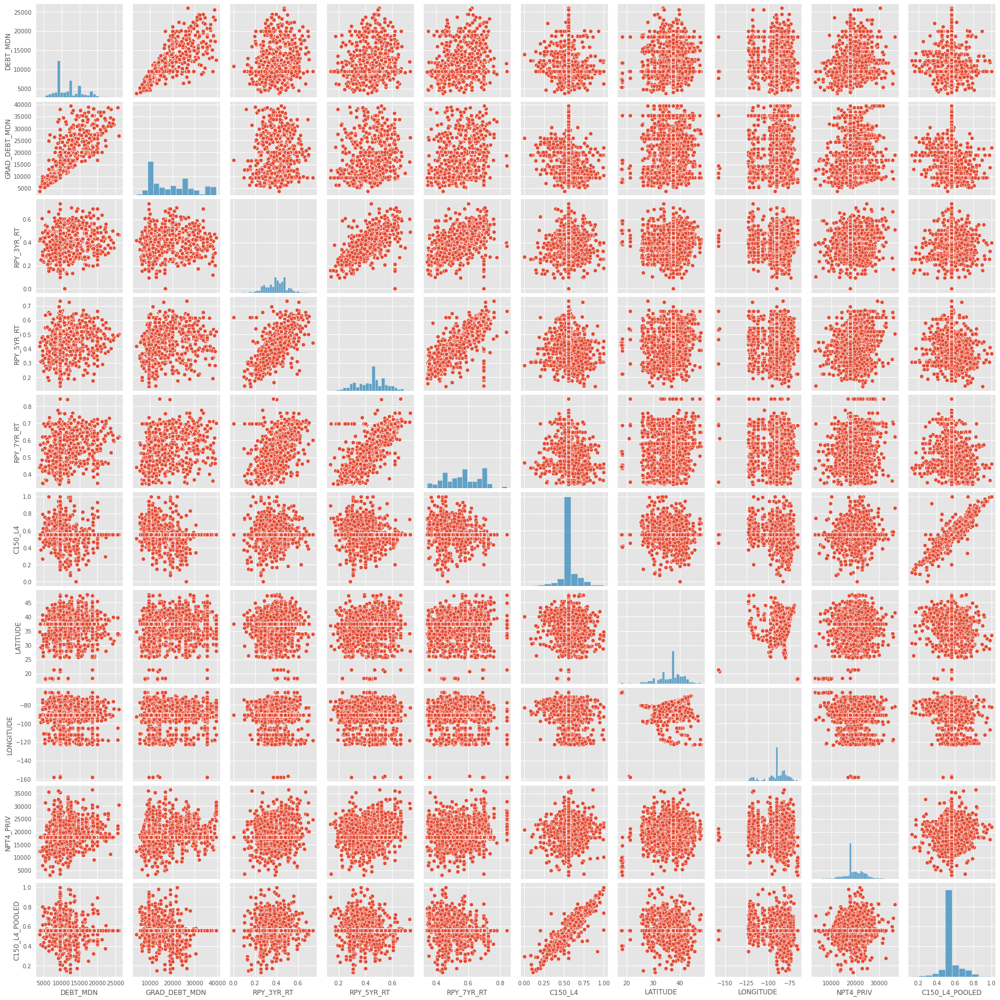

In [59]:
filters_pairs(df_filter, 2)

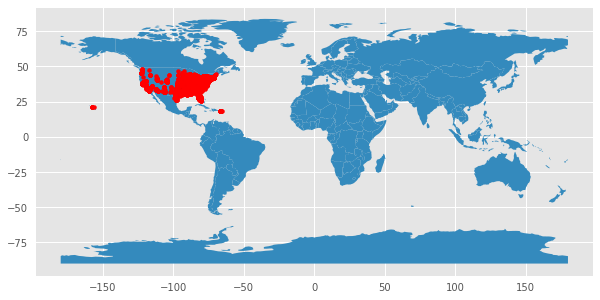

In [60]:
plotes_mundial(df_filter, 2)

En el grupo 2, se agruparon en su mayoría a las instituciones que están ubicadas en la parte este de Estados Unidos.

### Variables categóricas

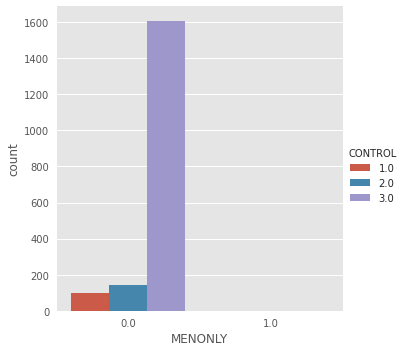

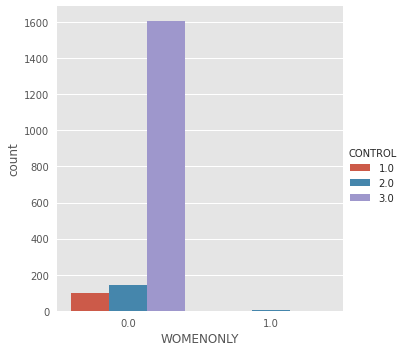

In [61]:
sns.catplot(data=df_filter[df_filter["Cluster"] == 2], x="MENONLY", kind='count', hue="CONTROL")
sns.catplot(data=df_filter[df_filter["Cluster"] == 2], x="WOMENONLY", kind='count', hue="CONTROL")

En el clúster 3, están en mayor cantidad las instituciones que son de tipo privado con fines de lucro (3). También se presentan de los otros 2 tipos de universidades (público y privado sin ánimo de lucro), pero en menor cantidad.

## Clúster 3

### Variables numéricas

           DEBT_MDN  GRAD_DEBT_MDN   RPY_3YR_RT   RPY_5YR_RT   RPY_7YR_RT  \
count   2757.000000    2757.000000  2757.000000  2757.000000  2757.000000   
mean    9621.633481   12418.733867     0.591856     0.611623     0.684874   
std     2671.559569    4272.094175     0.099674     0.085052     0.069993   
min     2978.000000    3772.000000     0.123810     0.225352     0.372611   
25%     7500.000000    9083.000000     0.591464     0.613419     0.696111   
50%     9833.000000   12000.000000     0.591464     0.620270     0.696111   
75%    11736.651050   16782.101893     0.611390     0.620270     0.696111   
max    20500.000000   27000.000000     1.000000     1.000000     0.919811   

           C150_L4     LATITUDE    LONGITUDE     NPT4_PRIV  C150_L4_POOLED  
count  2757.000000  2757.000000  2757.000000   2757.000000     2757.000000  
mean      0.680830    37.103319   -90.507407  15218.628627        0.682729  
std       0.145710     6.168560    16.735197   4976.910086        0.136849 

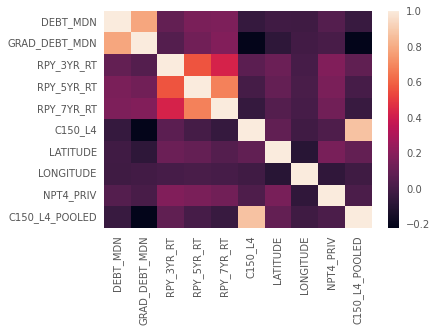

In [62]:
filters_corr(df_filter, 3)

In [63]:
filters_descriptive(df_filter, 3)

           DEBT_MDN  GRAD_DEBT_MDN   RPY_3YR_RT   RPY_5YR_RT   RPY_7YR_RT  \
count   2757.000000    2757.000000  2757.000000  2757.000000  2757.000000   
mean    9621.633481   12418.733867     0.591856     0.611623     0.684874   
std     2671.559569    4272.094175     0.099674     0.085052     0.069993   
min     2978.000000    3772.000000     0.123810     0.225352     0.372611   
25%     7500.000000    9083.000000     0.591464     0.613419     0.696111   
50%     9833.000000   12000.000000     0.591464     0.620270     0.696111   
75%    11736.651050   16782.101893     0.611390     0.620270     0.696111   
max    20500.000000   27000.000000     1.000000     1.000000     0.919811   

           C150_L4     LATITUDE    LONGITUDE     NPT4_PRIV  C150_L4_POOLED  
count  2757.000000  2757.000000  2757.000000   2757.000000     2757.000000  
mean      0.680830    37.103319   -90.507407  15218.628627        0.682729  
std       0.145710     6.168560    16.735197   4976.910086        0.136849 

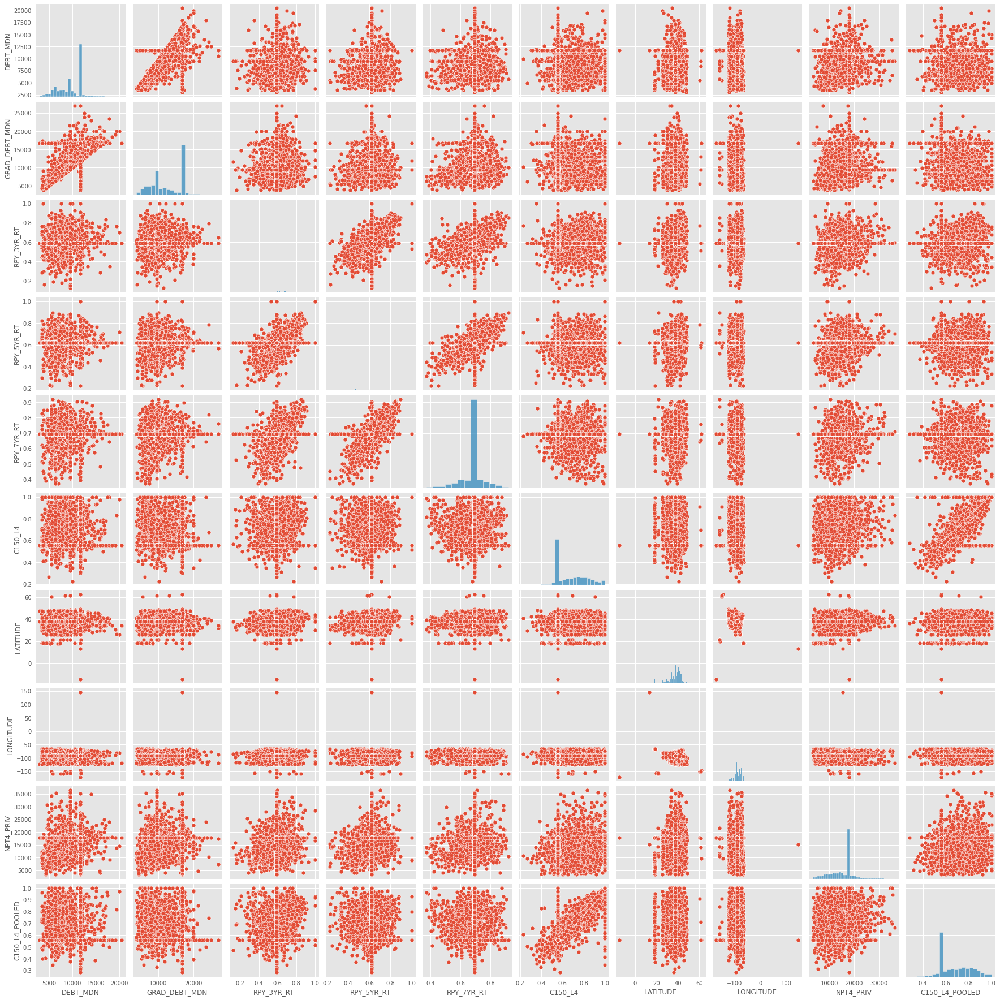

In [64]:
filters_pairs(df_filter, 3)

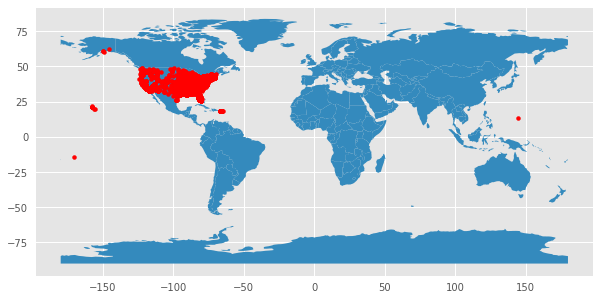

In [65]:
plotes_mundial(df_filter, 3)

Las universidades de este clúster también se ven agrupadas en la parte este de Estados Unidos, sin embargo, se presentan más observaciones, y en mayor cantidad que en el clúster anterior, en la parte oeste y la zona costeras.

### Variables categóricas

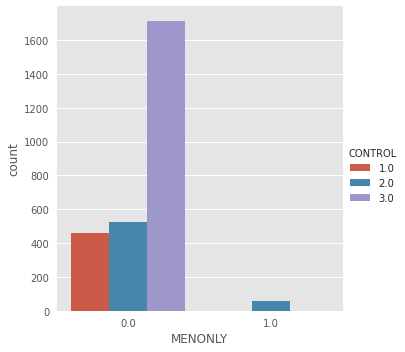

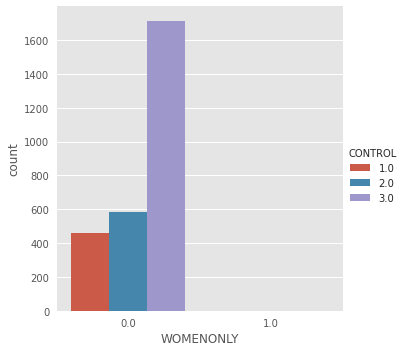

In [66]:

sns.catplot(data=df_filter[df_filter["Cluster"] == 3], x="MENONLY", kind='count', hue="CONTROL")
sns.catplot(data=df_filter[df_filter["Cluster"] == 3], x="WOMENONLY", kind='count', hue="CONTROL" )

En este último clúster también predominan las universidades privadas con fines de lucro (3), pero se pueden observar que poco más de 400 pertenecen al sector público y casi 600 al sector privado sin fines de lucro.

In [67]:
save_columns = list(columns) + ["Cluster"]
df_filter[variables_categorical] = df_filter[variables_categorical].astype("category")
df_filter[save_columns].to_csv('df_filter.csv')

## Conclusiones

- En general, las instituciones de carácter privado con fines de lucro están ubicadas en el este de Estados unidos, y estas quedaron agrupadas en su mayoría en los clústers 2 y 3.

- Los estudiantes de las instituciones agrupadas en el clúster 0, son los que menos dinero reciben en préstamos federales, en consecuencia el pago de la deuda entre 5 y 7 años es constante. Aunque reciben menos préstamo se demoran más tiempo en pagar que los del grupo 2.

- De las universidades del clúster 1, más de la mitad son privadas sin fines de lucro, pero también se observa una concentración en las de tipo público. Los estudiantes de las instituciones en el clúster 1 son los que reciben, en promedio, préstamos más altos, el cuál va entre los $15000 y $18000 dólares; por esta razón, es el grupo que más demora en pagar su deuda entre los 3, 5 y 7 años. 

- En el cluster 2 se concentra principalmente universidades  privadas con fines de lucro y la capacidad de endeudamiento está entre los 11000 y 14000 dolares, es el grupo que más rápido paga sus deudas.

- En el cluster 3 la mayoría son instituciones privadas con fines de lucro y el porcentaje de entidades publicas y privadas sin fines de lucro es similar entre ambos. Tienen un promedio de endeudamiento entre 9000 y 11000. y su tiempo de pago es el segundo grupo que más se demora.

- Hay pocas Universidades en servicio a las minorías hispanas.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=75e34ce2-1641-4c65-be6d-29564b23ed4c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>